In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
#https://huggingface.co/ByteDance/SDXL-Lightning

In [4]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.1 MB/s eta 0:00:00a 0:00:01


In [5]:
import torch
import diffusers
from diffusers import StableDiffusionXLPipeline, UNet2DConditionModel, EulerDiscreteScheduler
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-03-15 02:12:03.195684: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-15 02:12:03.195814: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-15 02:12:03.494113: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [6]:
base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_4step_unet.safetensors" # Use the correct ckpt for your step setting!


In [7]:
unet = UNet2DConditionModel.from_config(base, subfolder="unet").to("cuda", torch.float16)
unet.load_state_dict(load_file(hf_hub_download(repo, ckpt), device="cuda"))
pipe = StableDiffusionXLPipeline.from_pretrained(base, unet=unet, torch_dtype=torch.float16, variant="fp16").to("cuda")


/opt/conda/lib/python3.10/site-packages/diffusers/configuration_utils.py:244: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a model, please use <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.load_config(...) followed by <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.from_config(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

sdxl_lightning_4step_unet.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")


In [9]:
pipe("A girl smiling", num_inference_steps=4, guidance_scale=0).images[0].save("output.png")

  0%|          | 0/4 [00:00<?, ?it/s]

In [11]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Used to change filepaths
from pathlib import Path
import matplotlib.pyplot as plt
import IPython
from IPython.display import display
from PIL import Image
%matplotlib inline
import os
print(os.listdir("./"))

FileNotFoundError: [Errno 2] No such file or directory: 'P:\\Prompt Engineering'

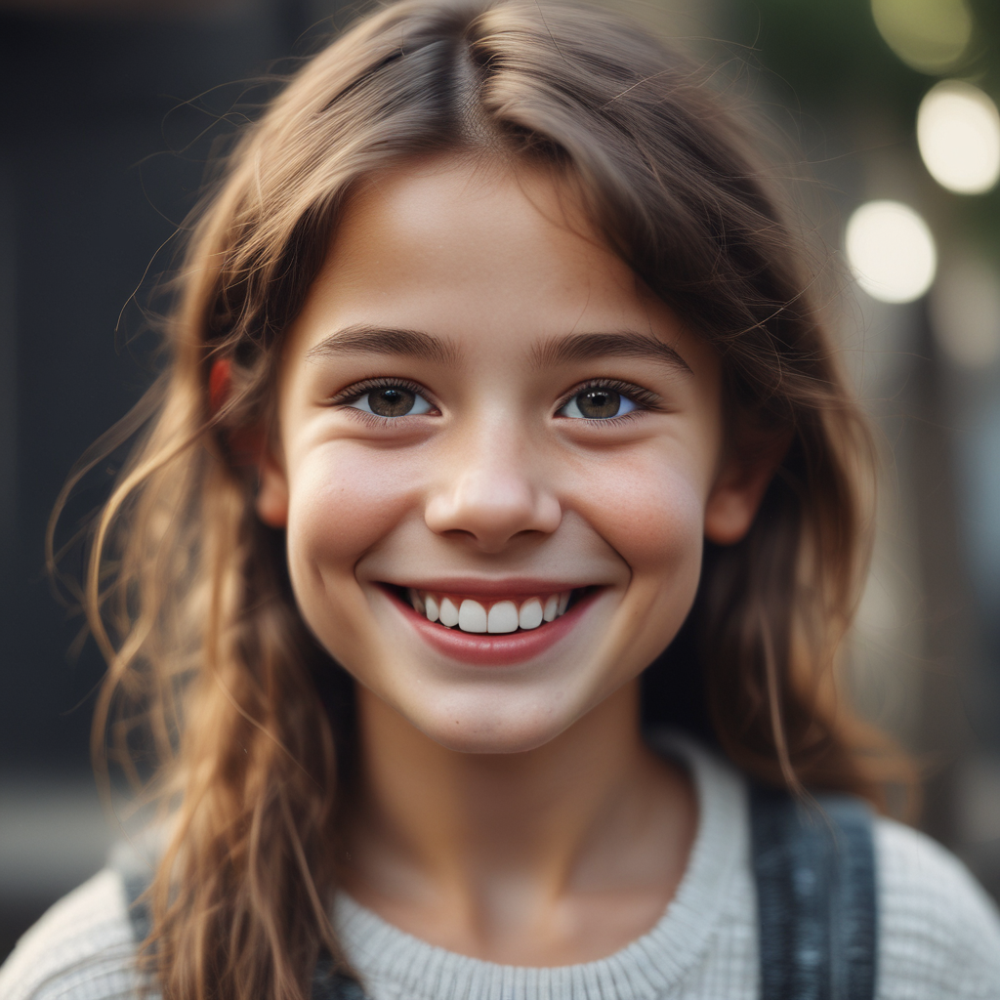

In [12]:
IPython.display.Image(filename='output.png') 

In [13]:
pipe("sunrise at the beach", num_inference_steps=4, guidance_scale=0).images[0].save("output1.png")

  0%|          | 0/4 [00:00<?, ?it/s]

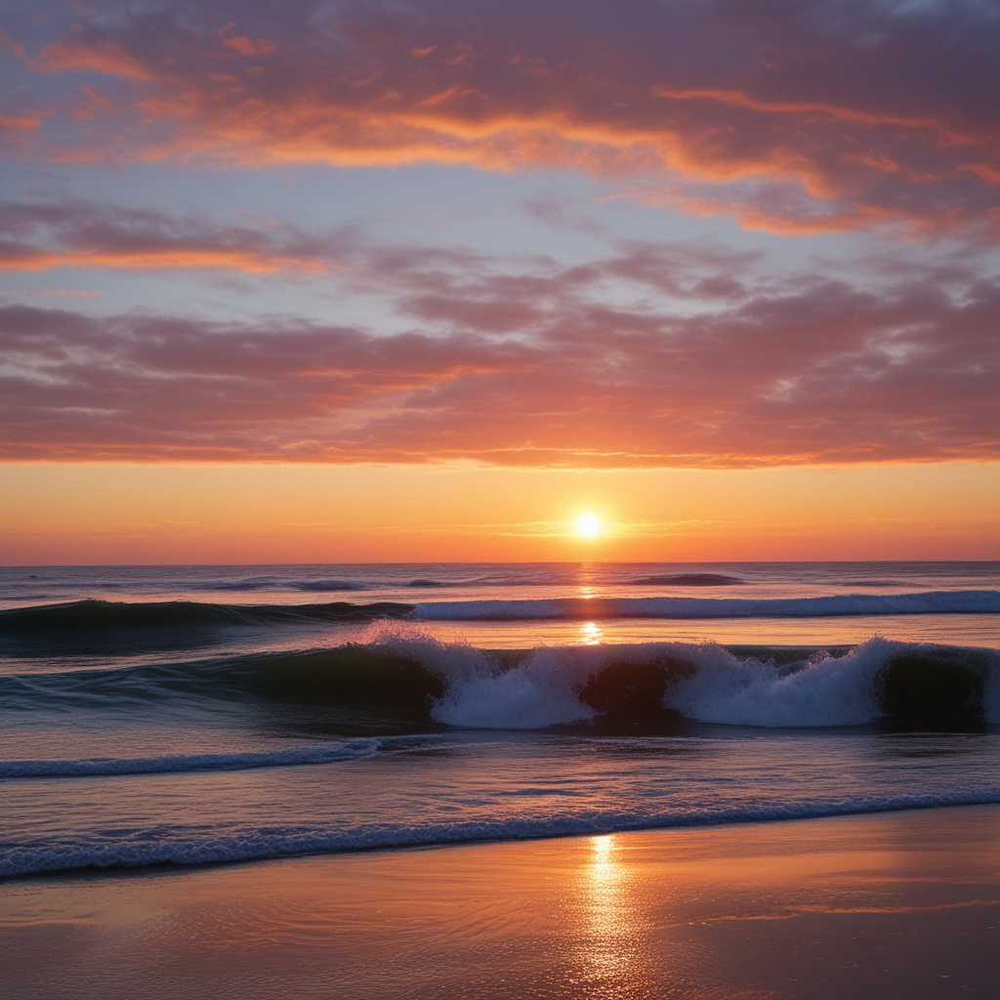

In [14]:
IPython.display.Image(filename='output1.png') 

In [16]:
pipe("pandas playing in the tree", num_inference_steps=4, guidance_scale=0).images[0].save("output2.png")

  0%|          | 0/4 [00:00<?, ?it/s]

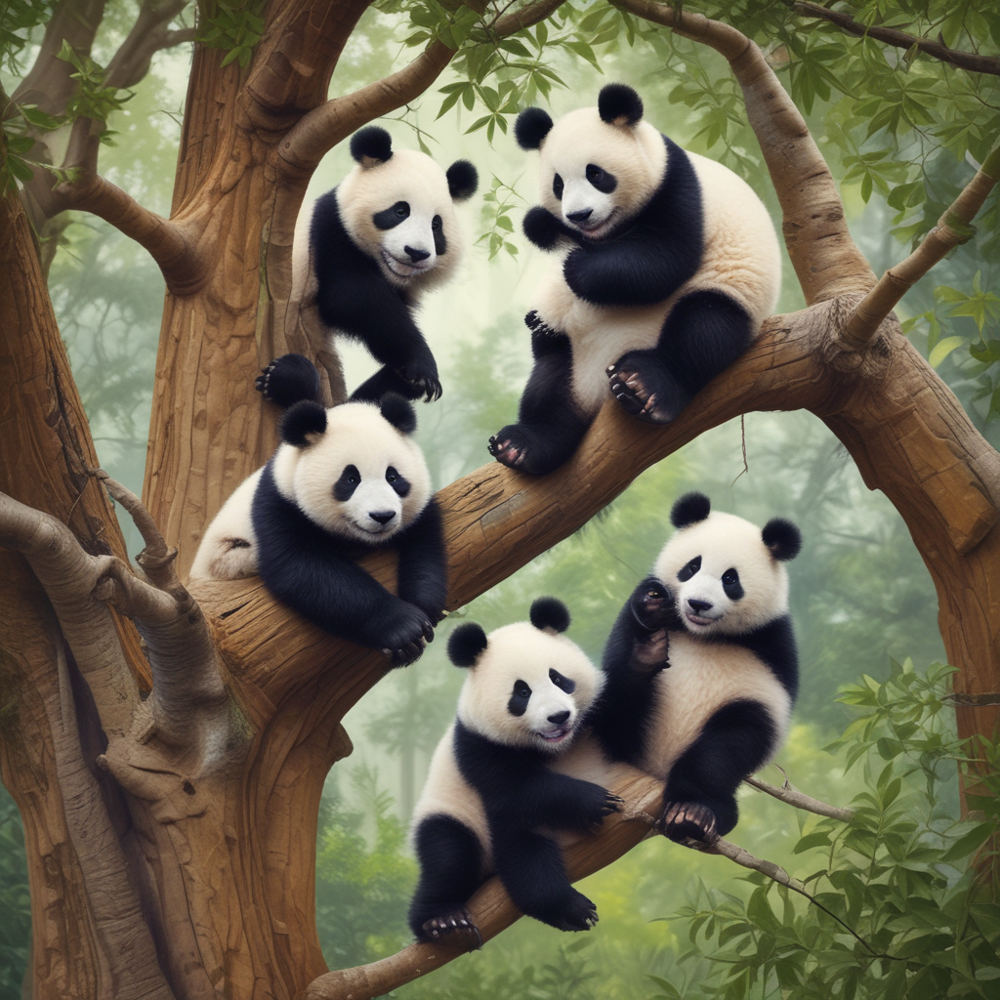

In [17]:
IPython.display.Image(filename='output2.png')

In [18]:
pipe("monkeys on the mango tree", num_inference_steps=4, guidance_scale=0).images[0].save("output3.png")

  0%|          | 0/4 [00:00<?, ?it/s]

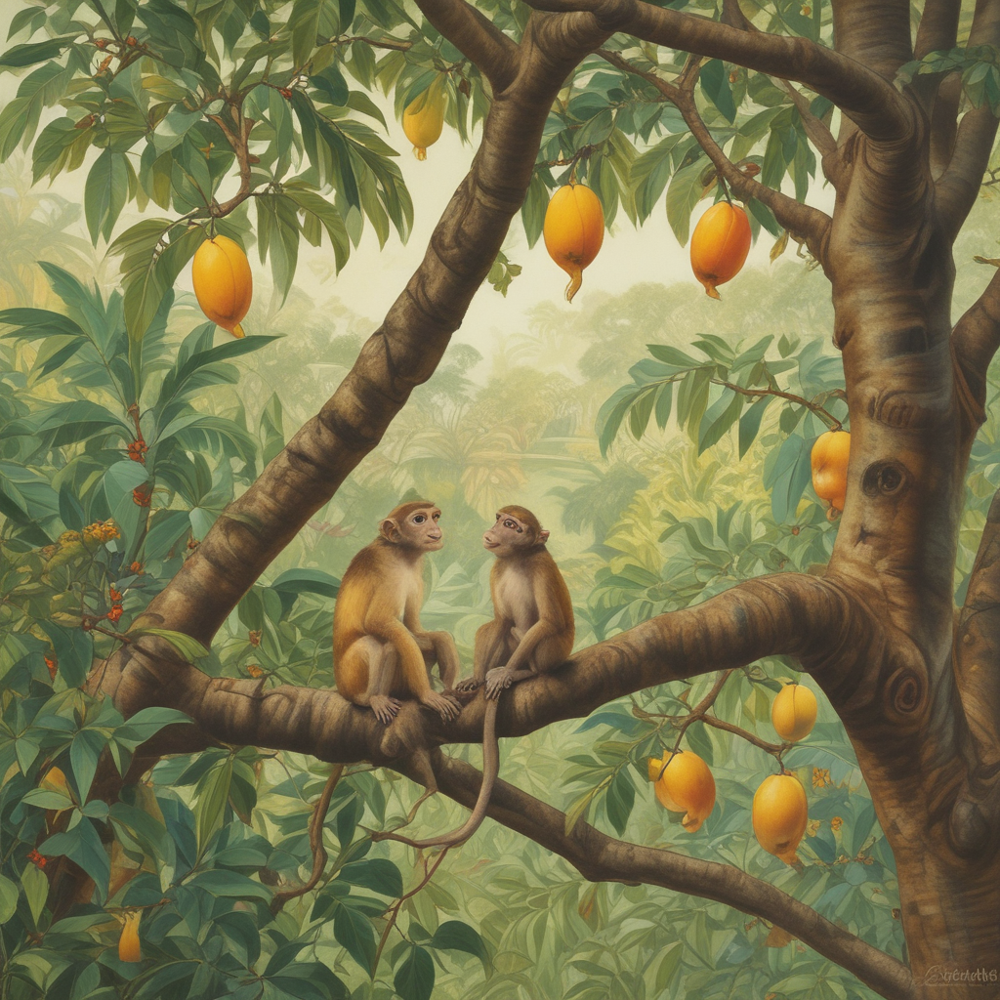

In [19]:
IPython.display.Image(filename='output3.png')

In [20]:
pipe("sunrise at the hill station", num_inference_steps=4, guidance_scale=0).images[0].save("output4.png")

  0%|          | 0/4 [00:00<?, ?it/s]

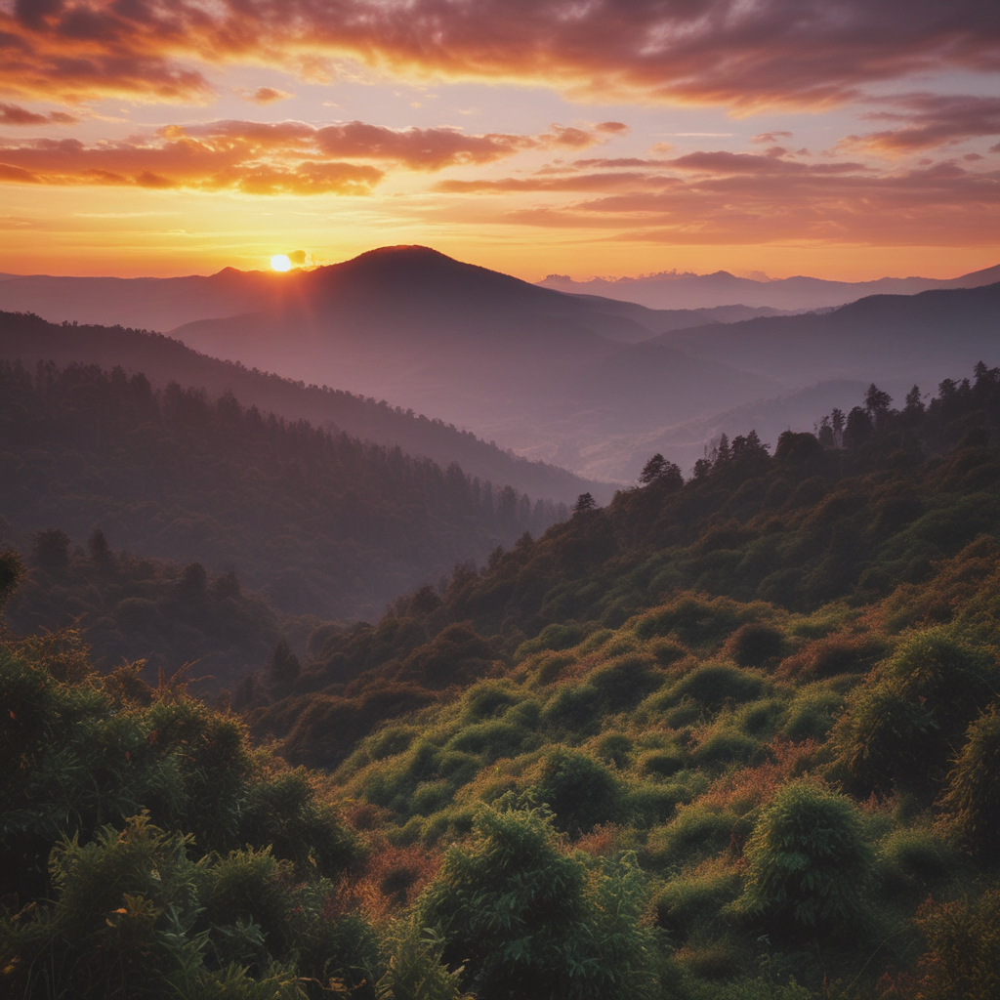

In [21]:
IPython.display.Image(filename='output4.png')

In [22]:
pipe("Busy evening in the Newyork city street", num_inference_steps=4, guidance_scale=0).images[0].save("output5.png")

  0%|          | 0/4 [00:00<?, ?it/s]

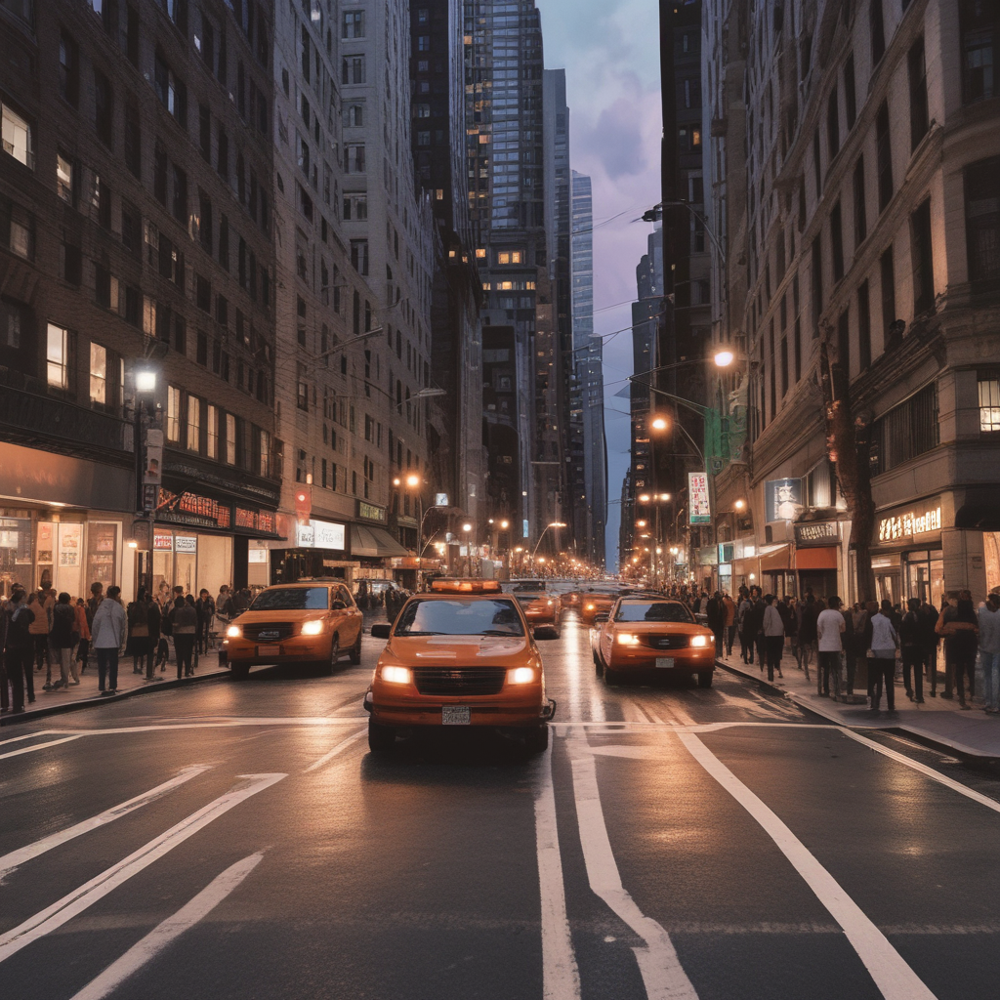

In [23]:
IPython.display.Image(filename='output5.png')

In [24]:
pipe("New year celebrations at Paris", num_inference_steps=4, guidance_scale=0).images[0].save("output6.png")

  0%|          | 0/4 [00:00<?, ?it/s]

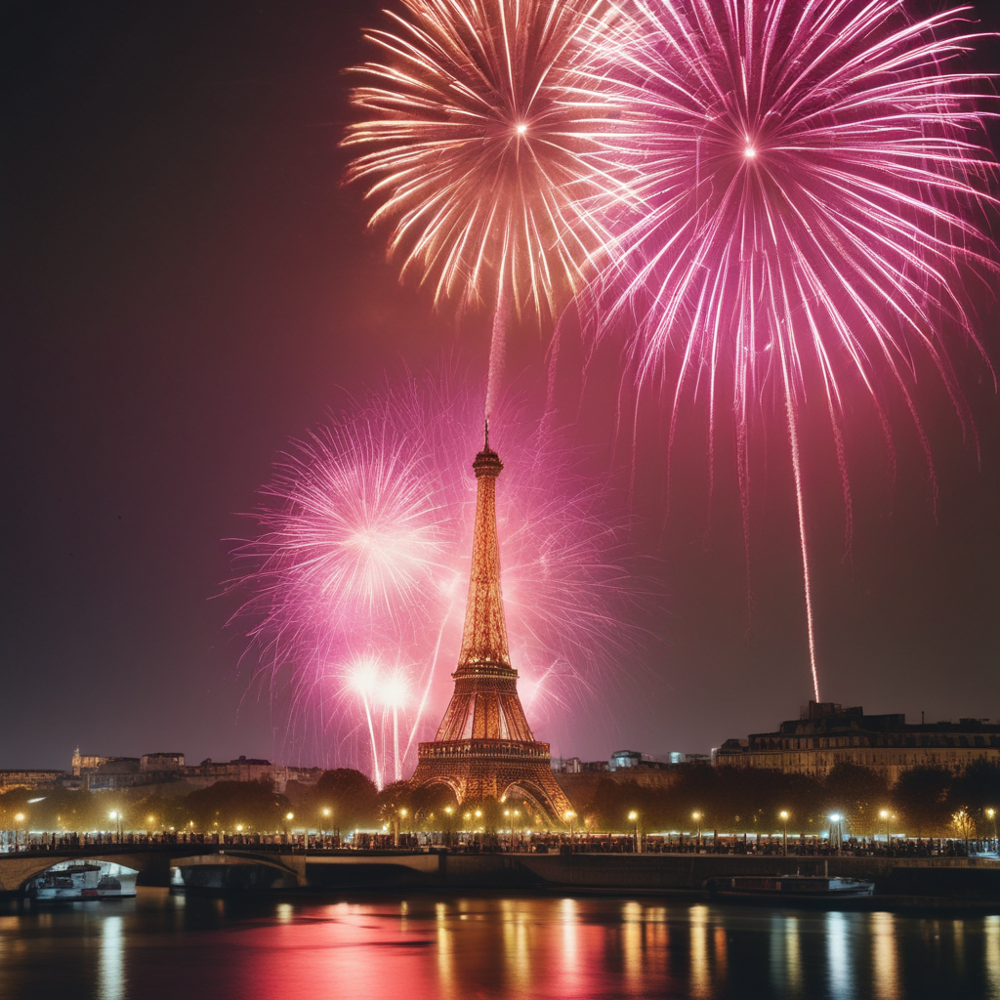

In [25]:
IPython.display.Image(filename='output6.png')

In [26]:
pipe("Ganesh chaturdhi celebrations in India", num_inference_steps=4, guidance_scale=0).images[0].save("output7.png")

  0%|          | 0/4 [00:00<?, ?it/s]

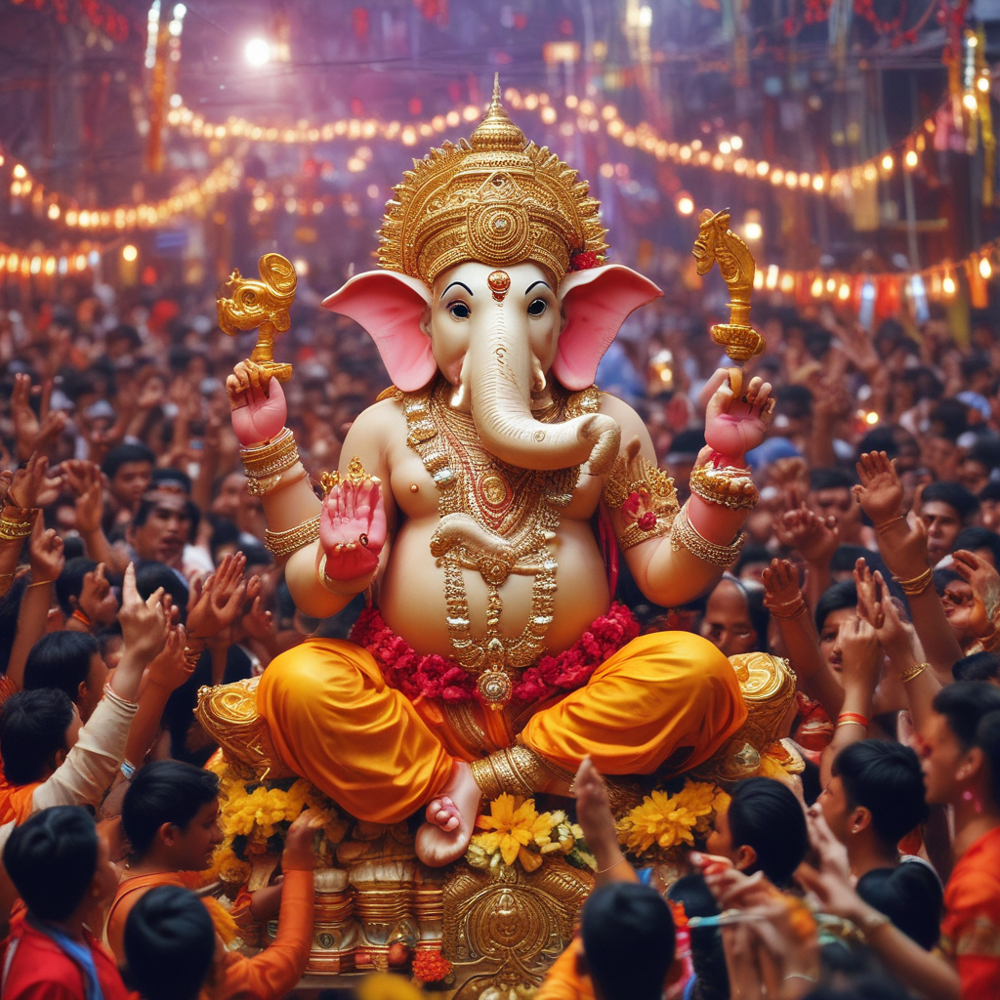

In [27]:
IPython.display.Image(filename='output7.png')

In [29]:
pipe("View of Earth from Moon", num_inference_steps=4, guidance_scale=0).images[0].save("output8.png")

  0%|          | 0/4 [00:00<?, ?it/s]

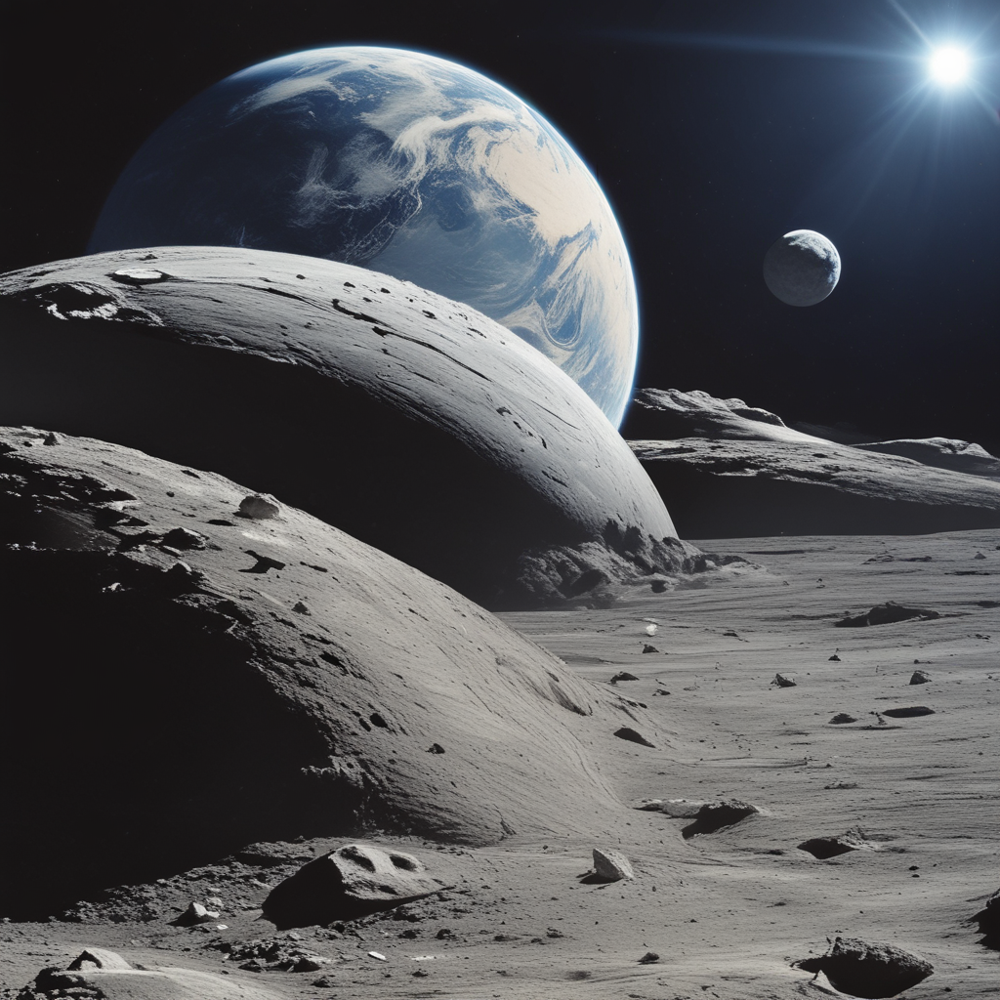

In [30]:
IPython.display.Image(filename='output8.png')